In [1]:
import cv2
import numpy as np
import keras

Using TensorFlow backend.


In [2]:
from keras.layers import Input
from keras.models import Model
from keras.layers import Flatten,Dense


vgg16_input = Input(shape = (224, 224, 3), name = 'Image_input')

from keras.applications.vgg16 import VGG16, preprocess_input

model_vgg16_conv = VGG16(weights='imagenet', include_top=False, input_tensor = vgg16_input)



output_vgg16_conv = model_vgg16_conv(vgg16_input)

x = Flatten(name='flatten')(output_vgg16_conv)
x = Dense(10, activation='softmax', name='predictions')(x)

vgg16_pretrained = Model(input = vgg16_input, output = x)


vgg16_pretrained.load_weights('vgg_weights_aug_setval_sgd_final.hdf5')

print('The Model is loaded')

The Model is loaded


<ipython-input-2-7b2cba0e4784>:19: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("Im..., outputs=Tensor("pr...)`
  vgg16_pretrained = Model(input = vgg16_input, output = x)


In [3]:
tags = { "C0": "safe driving",
"C1": "texting - right",
"C2": "On the phone - right",
"C3": "texting - left",
"C4": "On the phone - left",
"C5": "operating the radio",
"C6": "drinking",
"C7": "reaching behind",
"C8": "hair and makeup",
"C9": "talking to passenger" }

In [4]:
images = []
clean_image = []

cap = cv2.VideoCapture('video.mp4')

while True:
    ret, frame = cap.read()
    if not ret:
        break
    else:
        img = frame[50:,120:-50]
        img = cv2.resize(img,(224,224))
        images.append(img)
        clean_image.append(frame)
        

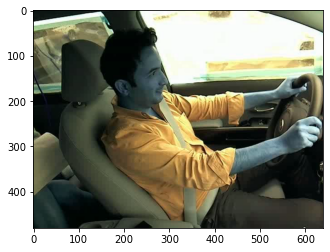

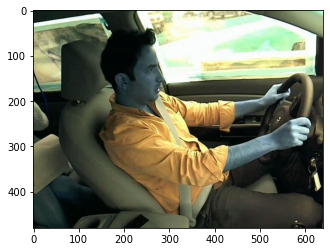

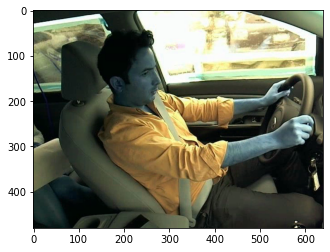

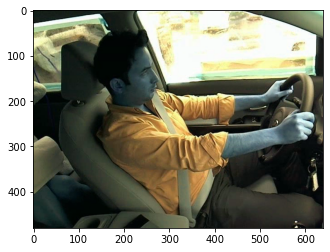

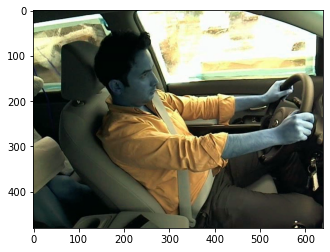

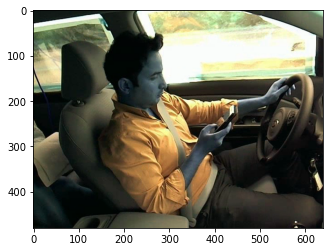

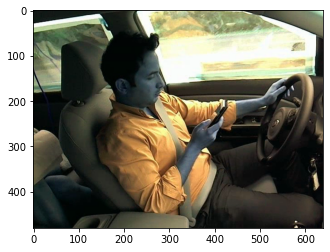

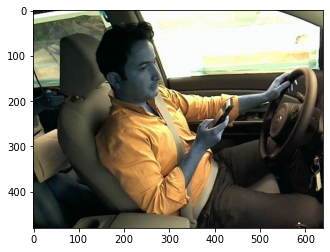

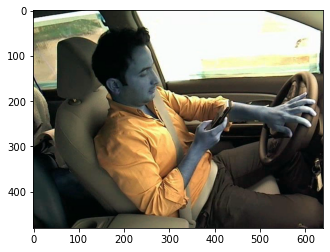

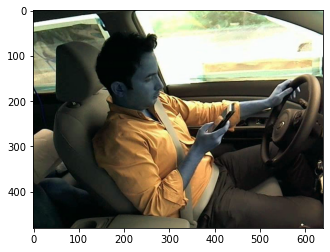

In [5]:
import matplotlib.pyplot as plt
i=0
for i in range(10):
    plt.imshow(clean_image[i])
    plt.show()

In [6]:
test_images = np.array(images).reshape(-1,224,224,3)

In [7]:
model_prediction = []
model_pred_class = []

model_prediction = vgg16_pretrained.predict(test_images)
print('Images Predicted until now:',len(model_prediction))

Images Predicted until now: 117


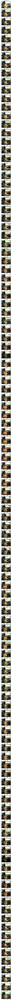

In [8]:
i = 0
tags_previous = ''
cntr = 0

fig, ax = plt.subplots(len(model_prediction), 1, figsize = (400,400))

for i in range(len(model_prediction)):
    predicted_class = 'C'+str(np.where(model_prediction[i] == np.amax(model_prediction[i]))[0][0])
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = tags[predicted_class].upper()+':'+str(round(model_prediction[i].max()*100,0))+'%'
    if tags[predicted_class] != tags_previous:
        cntr = 0

    if tags[predicted_class] == 'safe driving':
        cv2.putText(clean_image[i],text,(40,35), font, 0.8 ,(0,256,0),2)
    else:
        if cntr >= 0:
            cv2.putText(clean_image[i],text,(40,35), font, 0.8 ,(0,0,256),2)
        else:
            text = str(cntr+1)
            cntr = cntr+1
            print('came here')
            cv2.putText(clean_image[i],text,(40,35), font, 0.8 ,(0,0,256),2)

    tags_previous = tags[predicted_class]

    j = i-40 
    ax[j].imshow(clean_image[i].squeeze())
    ax[j].set_title(tags[predicted_class])

    plt.show

In [9]:
out = cv2.VideoWriter('Predictedvideo_New.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 3,  (640,480))
 
for i in range(len(clean_image)):
    out.write(clean_image[i])
out.release()